In [1]:
# SAVE 데이터 로드
import os
os.chdir('../')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from module.util_main import downsampling, dim_reduct
from collections import defaultdict
font = {'size': 16, 'family':"Malgun Gothic"}
matplotlib.rc('font', **font)

from pathlib import Path

### 에너지 데이터 로드
SAVE = pd.read_csv('data/SAVE/power_0428.csv', index_col=0)
SAVE = SAVE.iloc[84:,:]
SAVE.index = pd.to_datetime(SAVE.index)
SAVE[SAVE == 0] = np.nan
SAVE = SAVE.loc[pd.to_datetime('2017-01-01 00:00'):,:]

helper_dict = defaultdict(list)
for col in SAVE.columns:
    helper_dict[col[2:]].append(col)

# 동일 집끼리 병합
drop_cols = []
invalid_idx_list = []
for key,value in helper_dict.items():
    if len(value) >= 2:
        valid_idx_1 = ~pd.isnull(SAVE[value[1]])

        # replace value
        SAVE[value[0]][valid_idx_1] = SAVE[value[1]][valid_idx_1]

        # delete remain
        drop_cols.append(value[1])

# drop cols
SAVE.drop(columns = drop_cols, inplace = True)

# label과 data의 column 맞춤
SAVE.columns = [c[2:] for c in SAVE.columns]

### 라벨 로드
SAVE_label = pd.read_csv('data/SAVE/save_household_survey_data_v0-3.csv', index_col = 0)
# Interviedate가 빠른 순으로 정렬
SAVE_label.sort_values('InterviewDate', inplace = True)
SAVE_label = SAVE_label.T
SAVE_label.columns = SAVE_label.columns.astype(str)

# 라벨 순서를 데이터 순서와 맞춤
valid_col = []
for col in SAVE.columns:
    if col in SAVE_label.columns:
        valid_col.append(col)

SAVE_label = SAVE_label[valid_col].T
SAVE = SAVE[valid_col]
print('Done load SAVE')
SAVE[SAVE == 0] = np.nan

# CER 데이터 로드
# %% load dataset
# start_date = pd.to_datetime('2010-09-01 00:00:00')
# end_date = pd.to_datetime('2009-12-01 23:00:00')

power_df = pd.read_csv('data/CER/power_comb_SME_included.csv')

# 0 to NaN
power_df[power_df==0] = np.nan
power_df['time'] = pd.to_datetime(power_df['time'])
power_df.set_index('time', inplace=True)

# load label
CER_label = pd.read_csv('data/CER/survey_processed_0427.csv')
CER_label['ID'] = CER_label['ID'].astype(str)
CER_label.set_index('ID', inplace=True)

CER = power_df.loc[:,CER_label.index]
del power_df
print('Done load CER')

## 기간을 6개월 한정
start_date = pd.to_datetime('2018-01-01 00:00:00')
end_date = pd.to_datetime('2018-06-30 23:45:00')

SAVE = SAVE.loc[start_date:end_date,:]

start_date = pd.to_datetime('2010-01-01 00:00:00')
end_date = pd.to_datetime('2010-06-30 23:30:00')

CER = CER.loc[start_date:end_date,:]

# Downsampling SAVE
n = SAVE.shape[0]
list_ = []
time_ = []
for i in range(0, n, 2):
    data = SAVE.iloc[i:i+2,:]
    invalid_data_idx = np.any(pd.isnull(data), axis=0)
    data = data.sum(axis=0)
    data.iloc[invalid_data_idx] = np.nan
    list_.append(data)
    time_.append(SAVE.index[i])
list_ = pd.concat(list_, axis=1).T
list_.index = time_
SAVE = list_
del list_

# load ETRI
ETRI = pd.read_csv('data/ETRI/label_0427.csv', index_col=0)
ETRI.index = pd.to_datetime(ETRI.index)
start_date = pd.to_datetime('2018-01-01 00:00:00')
end_date = pd.to_datetime('2018-06-30 23:00:00')
ETRI = ETRI.loc[start_date:end_date,:]
ETRI_label = pd.read_csv('data/ETRI/survey_0427.csv', index_col = 0)
ETRI[ETRI == 0] = np.nan

nan_ratio = pd.isnull(SAVE).sum(axis=0) / SAVE.shape[0]
invalid_idx = (nan_ratio == 1)
SAVE = SAVE.loc[:,~invalid_idx]
SAVE_label = SAVE_label.loc[~invalid_idx,:]

# invalid house processing
nan_ratio = pd.isnull(CER).sum(axis=0) / CER.shape[0]
invalid_idx = (nan_ratio == 1)
CER = CER.loc[:,~invalid_idx]
CER_label = CER_label.loc[~invalid_idx,:]

print(CER.shape)
print(CER_label.shape)

nan_ratio = pd.isnull(ETRI).sum(axis=0) / ETRI.shape[0]
invalid_idx = (nan_ratio == 1)
ETRI = ETRI.loc[:,~invalid_idx]
ETRI_label = ETRI_label.T.loc[~invalid_idx,:]

print(SAVE.shape)
print(CER.shape)


Done load SAVE
Done load CER
(8688, 3248)
(3248, 15)
(8688, 3192)
(8688, 3248)


CER label 중 가전기기수 변경

In [105]:
survey_raw = pd.read_csv('data/CER/Smart meters Residential pre-trial survey data.csv', encoding='cp1252', low_memory=False)
survey_raw.set_index('ID', inplace=True)
# replace blanks
for j in range(survey_raw.shape[1]):
    for i in range(survey_raw.shape[0]):
        try:
            int(survey_raw.iloc[i, j])
        except:
            survey_raw.iloc[i, j] = -1

for j in range(survey_raw.shape[1]):
    survey_raw.iloc[:, j] = survey_raw.iloc[:, j].astype(int)

# processed survey data
survey = pd.DataFrame(index = survey_raw.index)

Q49002 = ['Question 49002: Washing machine',
'Question 49002: Tumble dryer',
'Question 49002: Dishwasher',
'Question 49002: Electric shower (instant)',
'Question 49002: Electric shower (electric pumped from hot tank)',
'Question 49002: Electric cooker',
'Question 49002: Electric heater (plug-in convector heaters)',
'Question 49002: Stand alone freezer',
'Question 49002: A water pump or electric well pump or pressurised water system',
'Question 49002: Immersion']
Q490002=[
'Question 490002: TV’s less than 21 inch',
'Question 490002: TV’s greater than 21 inch',
'Question 490002: Desk-top computers',
'Question 490002: Lap-top computers',
'Question 490002: Games consoles, such as xbox, playstation or Wii']

survey['Q12'] = 0
for Question in Q49002:
    val = survey_raw.loc[:,Question].values.copy()
    val[val<=1] = 0
    val[val == 2] = 1
    val[val == 3] = 2
    val[val == 4] = 3
    survey['Q12'] += val

for Question in Q490002:
    val = survey_raw.loc[:,Question].values.copy()
    val[val<=1] = 0
    val[val == 2] = 1
    val[val == 3] = 2
    val[val == 4] = 3
    val[val == 5] = 4
    survey['Q12'] += val

survey.index = survey.index.astype(str)
CER_label['Q12'] = survey.loc[CER_label.index,'Q12']

Daily 형태로 변환

In [2]:
def transform(df, sampling_interv = 24 * 2 * 7):
    '''
    [input]
    df: dataframe (timeseries, home)
    
    [output]
    data_2d: 2d array
    home_arr: home index array
    '''

    # dataframe => 3d numpy array
    n_d, n_h = df.shape
    n_w = n_d // sampling_interv
    n_d = n_w * sampling_interv
    df_rs = df.iloc[:n_d,:].values.T.reshape(n_h, -1, sampling_interv)

    # 3d numpy array => 2d numpy array
    n, m, l = df_rs.shape
    data_2d = df_rs.reshape(n*m, l)
    home_arr = np.repeat(np.arange(0, n), m)
    invalid_idx = np.any(pd.isnull(data_2d), axis=1)
    data_2d = data_2d[~invalid_idx, :]
    home_arr = home_arr[~invalid_idx]

    # constant load filtering
    invalid_idx = np.nanmin(data_2d, axis=1) == np.nanmax(data_2d, axis=1)
    data_2d = data_2d[~invalid_idx, :]
    home_arr = home_arr[~invalid_idx]

    return data_2d, home_arr

# 2d daily 형태로 변환 (house * day , hour)
CER_rs, home_arr_c = transform(CER, 24 * 2)
SAVE_rs, home_arr_s = transform(SAVE, 24 * 2)
ETRI_rs, home_arr_e = transform(ETRI, 24)


### model load

In [113]:
import pickle

with open('clustering_result/kmeans_0530.pickle', 'rb') as handle:
    kmeans_merge = pickle.load(handle)

with open('clustering_result/kmeans_partitioning_0531.pickle', 'rb') as handle:
    kmeans_part = pickle.load(handle)

import warnings
warnings.filterwarnings("ignore")


In [503]:
kmeans_merge.keys()

dict_keys(['CER_T0_2', 'CER_T1_2', 'CER_T2_2', 'CER_T3_2', 'CER_T4_2', 'CER_T5_2', 'CER_T6_2', 'CER_all_2', 'CER_T0_3', 'CER_T1_3', 'CER_T2_3', 'CER_T3_3', 'CER_T4_3', 'CER_T5_3', 'CER_T6_3', 'CER_all_3', 'CER_T0_4', 'CER_T1_4', 'CER_T2_4', 'CER_T3_4', 'CER_T4_4', 'CER_T5_4', 'CER_T6_4', 'CER_all_4', 'CER_T0_5', 'CER_T1_5', 'CER_T2_5', 'CER_T3_5', 'CER_T4_5', 'CER_T5_5', 'CER_T6_5', 'CER_all_5', 'CER_T0_6', 'CER_T1_6', 'CER_T2_6', 'CER_T3_6', 'CER_T4_6', 'CER_T5_6', 'CER_T6_6', 'CER_all_6', 'CER_T0_7', 'CER_T1_7', 'CER_T2_7', 'CER_T3_7', 'CER_T4_7', 'CER_T5_7', 'CER_T6_7', 'CER_all_7', 'CER_T0_8', 'CER_T1_8', 'CER_T2_8', 'CER_T3_8', 'CER_T4_8', 'CER_T5_8', 'CER_T6_8', 'CER_all_8', 'CER_T0_9', 'CER_T1_9', 'CER_T2_9', 'CER_T3_9', 'CER_T4_9', 'CER_all_9', 'CER_all_10', 'CER_all_11', 'CER_all_12', 'CER_all_13', 'SAVE_all_2', 'SAVE_all_3', 'SAVE_all_4', 'SAVE_all_5', 'SAVE_all_6', 'SAVE_all_7', 'SAVE_all_8', 'SAVE_all_9', 'SAVE_all_10', 'SAVE_all_11', 'SAVE_all_12', 'SAVE_all_13', 'SAVE_all

In [243]:
with open('clustering_result/CER_model_dict_0529.pickle', 'rb') as handle:
    tmp_dict = pickle.load(handle)
tmp_dict.keys()


dict_keys(['euc_p1_2', 'euc_p2_2', 'euc_p1_3', 'euc_p2_3', 'euc_p1_4', 'euc_p2_4', 'euc_p1_5', 'euc_p2_5', 'euc_p1_6', 'euc_p2_6', 'euc_p1_7', 'euc_p2_7', 'euc_p1_8', 'euc_p2_8', 'euc_p1_9', 'euc_p2_9', 'euc_p1_10', 'euc_p2_10', 'euc_p1_11', 'euc_p2_11', 'euc_p1_12', 'euc_p2_12', 'euc_p1_13', 'euc_p2_13', 'euc_p1_14', 'euc_p2_14', 'euc_p1_15', 'euc_p2_15', 'euc_p1_16', 'euc_p2_16', 'euc_p1_17', 'euc_p2_17', 'euc_p1_18', 'euc_p2_18', 'euc_p1_19', 'euc_p2_19', 'euc_2', 'euc_3', 'euc_4', 'euc_5', 'euc_6', 'euc_7', 'euc_8', 'euc_9', 'euc_10', 'euc_11', 'euc_12', 'euc_13'])

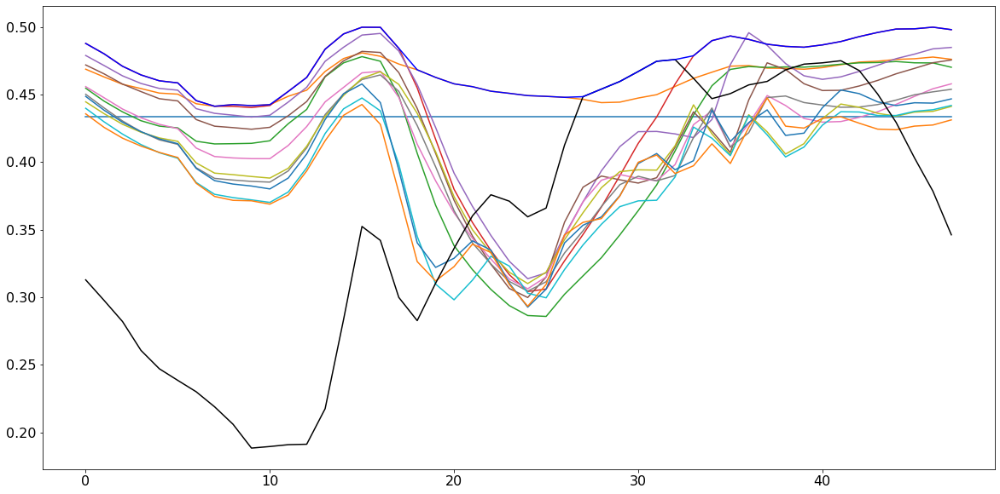

In [252]:
rep_load_dict = dict()

plt.figure(figsize = (20, 10))

data_name = 'CER'
# part_name = 'all'

p0 = range(0, 24*2)
p1 = range(0, 5*2)
p2 = range(5*2, 9*2)
p3 = range(9*2, 12*2)
p4 = range(12*2, 15*2)
p5 = range(15*2, 18*2)
p6 = range(18*2, 21*2)
p7 = range(21*2, 24*2)
time_list = [p0, p1, p2, p3, p4, p5, p6, p7]

# data_raw assign
if data_name == 'CER':
    data_raw = CER_rs
    label_raw = CER_label['Q13'].values
    home_arr = home_arr_c
elif data_name == 'SAVE':
    data_raw = SAVE_rs
    label_raw = SAVE_label['Q2'].values
    home_arr = home_arr_s
elif data_name == 'ETRI':
    data_raw = ETRI_rs
    label_raw = ETRI_label['popl_num'].values
    home_arr = home_arr_e

    # time frequency가 다름...
    p0 = range(0, 24)
    p1 = range(0, 5)
    p2 = range(5, 9)
    p3 = range(9, 12)
    p4 = range(12, 15)
    p5 = range(15, 18)
    p6 = range(18, 21)
    p7 = range(21, 24)
    time_list = [p0, p1, p2, p3, p4, p5, p6, p7]

invalid_idx = pd.isnull(label_raw)
# label_raw = label_raw[~invalid_idx]
invalid_home_num = np.where(invalid_idx)[0]
valid_home_idx = np.zeros(home_arr.shape, dtype = bool)
for j in range(home_arr.shape[0]):
    if home_arr[j] in invalid_home_num:
        valid_home_idx[j] = False
    else:
        valid_home_idx[j] = True
data_raw = data_raw[valid_home_idx,:]
home_arr = home_arr[valid_home_idx]
unique_home_arr = np.unique(home_arr)
label = np.array([label_raw[u] for u in unique_home_arr])

for i, part_name in enumerate(['all']): ### 오른쪽에 T0 ~ T6
    data = data_raw[:,time_list[i]]
 
    # for each cluster
    for N_Cluster in range(2, 20):
        key = f'{data_name}_{part_name}_{N_Cluster}'
        if key in kmeans_merge.keys():
            # load model
            model = kmeans_merge[key]
            
            # 대표부하 extract
            rep_load_for_each_cluster = []
            for n_c in range(N_Cluster):
                clusterig_result = model.predict(data)
                idx2 = clusterig_result == n_c
                rep_load_for_each_cluster.append(data[idx2,:].mean(axis=0))
            rep_cluster, rep_load_list, label_list = [], [], []
            for h in unique_home_arr:
                idx1 = home_arr == h
                v, c= np.unique(clusterig_result[idx1], return_counts=True)
                rep_c = v[np.argmax(c)]
                rep_cluster.append(rep_c)
                label_list.append(label_raw[h])
                rep_load_list.append(rep_load_for_each_cluster[rep_c])

            rep_load_arr = np.array(rep_load_list)
            rep_load_dict[key] = rep_load_arr
            
            # correlation 구하기
            corr_list = []
            for j in range(rep_load_arr.shape[1]):
                corr_list.append(np.corrcoef(rep_load_arr[:,j], np.ravel(label))[0,1])
            corr_list = np.array(corr_list)

            plt.plot(time_list[i], corr_list, label = key)

### reference - average
rep_cluster, rep_load_list, label_list = [], [], []
for h in unique_home_arr:
    idx1 = home_arr == h
    rep_load_list.append(np.mean(data_raw[idx1,:], axis=0))
    label_list.append(label_raw[h])
rep_load_arr = np.array(rep_load_list)
rep_load_dict['avg'] = rep_load_arr

# correlation 구하기
corr_list = []
for j in range(rep_load_arr.shape[1]):
    corr_list.append(np.corrcoef(rep_load_arr[:,j], np.ravel(label))[0,1])
corr_list = np.array(corr_list)
plt.plot(time_list[0], corr_list, label = 'avg', color = 'k')

# proposed
data_concat = []
data_concat.append(rep_load_dict['CER_all_5'][:,:8])
data_concat.append(rep_load_dict['CER_all_3'][:,8:11])
data_concat.append(rep_load_dict['CER_all_5'][:,11:18])
data_concat.append(rep_load_dict['CER_all_3'][:,18:27])
data_concat.append(rep_load_dict['avg'][:,27:33])
data_concat.append(rep_load_dict['CER_all_5'][:,33:48])
# data_concat.append(rep_load_dict['CER_T0_5'])
# data_concat.append(rep_load_dict['CER_T1_5'])
# data_concat.append(rep_load_dict['CER_T2_5'])
# data_concat.append(rep_load_dict['CER_T3_5'])
# data_concat.append(rep_load_dict['CER_T4_5'])
# data_concat.append(rep_load_dict['CER_T5_5'])
# data_concat.append(rep_load_dict['CER_T6_5'])
rep_load_arr = np.concatenate(data_concat, axis=1)
rep_load_dict['proposed'] = rep_load_arr

corr_list = []
for j in range(rep_load_arr.shape[1]):
    corr_list.append(np.corrcoef(rep_load_arr[:,j], np.ravel(label))[0,1])
corr_list = np.array(corr_list)
plt.plot(time_list[0], corr_list, label = 'proposed', color = 'b')

# plt.legend()
plt.show()


In [429]:

label_dict = dict()
data_dict = dict()
home_dict = dict()

for key in ['Q12','Q13']:
    data_raw = CER_rs
    label_raw = CER_label[key].values
    home_arr = home_arr_c

    invalid_idx = pd.isnull(label_raw)
    # label_raw = label_raw[~invalid_idx]
    invalid_home_num = np.where(invalid_idx)[0]
    valid_home_idx = np.zeros(home_arr.shape, dtype = bool)
    for j in range(home_arr.shape[0]):
        if home_arr[j] in invalid_home_num:
            valid_home_idx[j] = False
        else:
            valid_home_idx[j] = True
    data = data_raw[valid_home_idx,:]
    home_arr = home_arr[valid_home_idx]
    unique_home_arr = np.unique(home_arr)
    label = np.array([label_raw[u] for u in unique_home_arr])

    label_dict[key] = label
    data_dict[key] = data
    home_dict[key] = home_arr


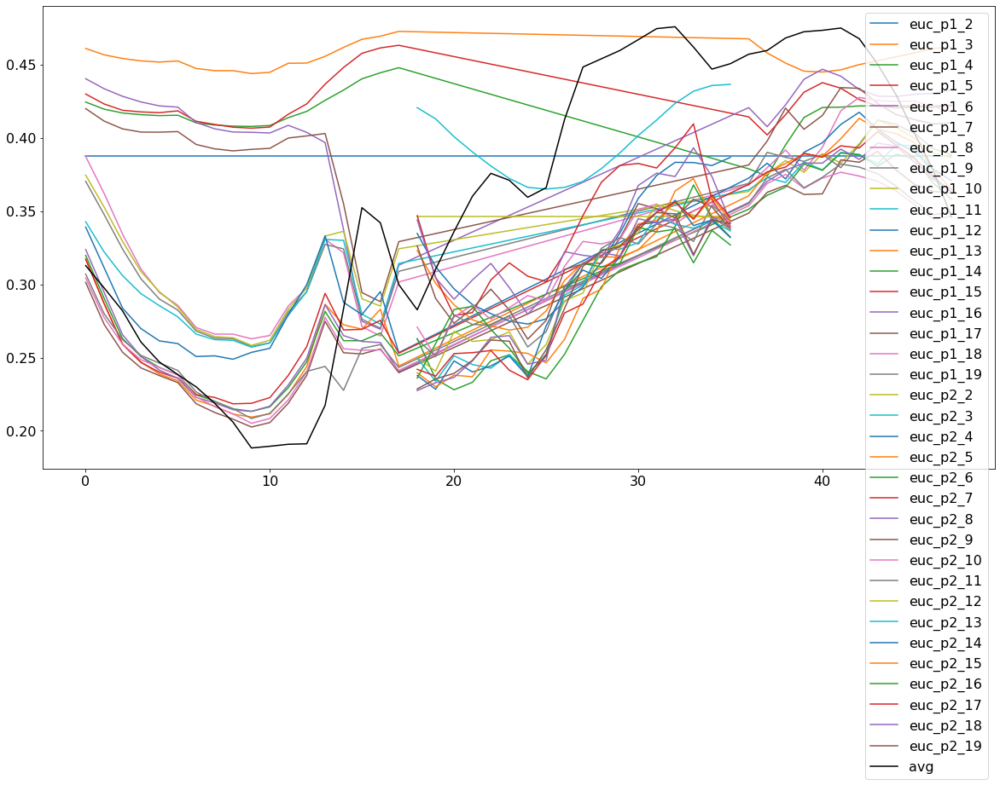

In [229]:
rep_load_dict = dict()

plt.figure(figsize = (20, 10))

data_name = 'CER'
# part_name = 'all'

p0 = list(range(0, 9*2)) + list(range(18*2, 48))
p1 = list(range(9*2, 18*2))
time_list = [p0, p1]

# data_raw assign
if data_name == 'CER':
    data_raw = CER_rs
    label_raw = CER_label['Q13'].values
    home_arr = home_arr_c
elif data_name == 'SAVE':
    data_raw = SAVE_rs
    label_raw = SAVE_label['Q2'].values
    home_arr = home_arr_s
elif data_name == 'ETRI':
    data_raw = ETRI_rs
    label_raw = ETRI_label['popl_num'].values
    home_arr = home_arr_e
    
    # time frequency가 다름...
    p0 = range(0, 24)
    p1 = range(0, 5)
    p2 = range(5, 9)
    p3 = range(9, 12)
    p4 = range(12, 15)
    p5 = range(15, 18)
    p6 = range(18, 21)
    p7 = range(21, 24)
    time_list = [p0, p1, p2, p3, p4, p5, p6, p7]

invalid_idx = pd.isnull(label_raw)
# label_raw = label_raw[~invalid_idx]
invalid_home_num = np.where(invalid_idx)[0]
valid_home_idx = np.zeros(home_arr.shape, dtype = bool)
for j in range(home_arr.shape[0]):
    if home_arr[j] in invalid_home_num:
        valid_home_idx[j] = False
    else:
        valid_home_idx[j] = True
data_raw = data_raw[valid_home_idx,:]
home_arr = home_arr[valid_home_idx]
unique_home_arr = np.unique(home_arr)
label = np.array([label_raw[u] for u in unique_home_arr])

for i, part_name in enumerate(['p1','p2']): 
    data = data_raw[:,time_list[i]]
 
    # for each cluster
    for N_Cluster in range(2, 20):
        key = f'euc_{part_name}_{N_Cluster}'
        if key in tmp_dict.keys():
            # load model
            model = tmp_dict[key]
            
            # 대표부하 extract
            rep_load_for_each_cluster = []
            for n_c in range(N_Cluster):
                clusterig_result = model.predict(data)
                idx2 = clusterig_result == n_c
                rep_load_for_each_cluster.append(data[idx2,:].mean(axis=0))
            rep_cluster, rep_load_list, label_list = [], [], []
            for h in unique_home_arr:
                idx1 = home_arr == h
                v, c= np.unique(clusterig_result[idx1], return_counts=True)
                rep_c = v[np.argmax(c)]
                rep_cluster.append(rep_c)
                label_list.append(label_raw[h])
                rep_load_list.append(rep_load_for_each_cluster[rep_c])

            rep_load_arr = np.array(rep_load_list)
            rep_load_dict[key] = rep_load_arr
            
            # correlation 구하기
            corr_list = []
            for j in range(rep_load_arr.shape[1]):
                corr_list.append(np.corrcoef(rep_load_arr[:,j], np.ravel(label))[0,1])
            corr_list = np.array(corr_list)

            # print(corr_list)
            plt.plot(time_list[i], corr_list, label = key)

### reference - average
rep_cluster, rep_load_list, label_list = [], [], []
for h in unique_home_arr:
    idx1 = home_arr == h
    rep_load_list.append(np.mean(data_raw[idx1,:], axis=0))
    label_list.append(label_raw[h])
rep_load_arr = np.array(rep_load_list)
rep_load_dict['avg'] = rep_load_arr

# # correlation 구하기
corr_list = []
for j in range(rep_load_arr.shape[1]):
    corr_list.append(np.corrcoef(rep_load_arr[:,j], np.ravel(label))[0,1])
corr_list = np.array(corr_list)
plt.plot(range(48), corr_list, label = 'avg', color = 'k')

plt.legend()
plt.show()


In [227]:
key

'euc_p2_19'

In [226]:
tmp_dict.keys()

dict_keys(['euc_p1_2', 'euc_p2_2', 'euc_p1_3', 'euc_p2_3', 'euc_p1_4', 'euc_p2_4', 'euc_p1_5', 'euc_p2_5', 'euc_p1_6', 'euc_p2_6', 'euc_p1_7', 'euc_p2_7', 'euc_p1_8', 'euc_p2_8', 'euc_p1_9', 'euc_p2_9', 'euc_p1_10', 'euc_p2_10', 'euc_p1_11', 'euc_p2_11', 'euc_p1_12', 'euc_p2_12', 'euc_p1_13', 'euc_p2_13', 'euc_p1_14', 'euc_p2_14', 'euc_p1_15', 'euc_p2_15', 'euc_p1_16', 'euc_p2_16', 'euc_p1_17', 'euc_p2_17', 'euc_p1_18', 'euc_p2_18', 'euc_p1_19', 'euc_p2_19'])

In [509]:
with open('clustering_result/kmeans_0603.pickle', 'wb') as handle:
    pickle.dump(kmeans_merge, handle, protocol=pickle.HIGHEST_PROTOCOL)

partitioning load concatenation

In [253]:
from sklearn import model_selection
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.model_selection import KFold
from collections import defaultdict
from sklearn.metrics import mean_absolute_error
kf = KFold(n_splits=5, shuffle = True, random_state = 1)
y = label.copy()
# y[y<=2] = 1
# y[y> 2] = 2
# y[y <= 8] = 1
# y[(y > 8) * (y <= 11)] = 2
# y[(y > 11)] = 3

result = []
for i, time_ in enumerate([range(48)]):
    result_acc = []
    for key in rep_load_dict.keys():
        # X = rep_load_dict[key][:,time_]
        X = rep_load_dict[key]
        result_tmp = np.zeros(y.shape)

        for train_index, test_index in kf.split(X):
            X_train, X_test = X[train_index], X[test_index]
            y_train, y_test = y[train_index], y[test_index]

            rfc = RandomForestRegressor()
            rfc.fit(X_train, y_train)
            rfc_predict = rfc.predict(X_test)

            # print(key)
            result_tmp[test_index] = rfc_predict
        # result[key] = result_tmp
        result_mae = mean_absolute_error(y, result_tmp)
        print(key + '::{:.3f}'.format(result_mae))

        result_acc.append(result_mae)
    result.append(result_acc)


CER_all_2::1.051
CER_all_3::0.967
CER_all_4::0.972
CER_all_5::0.943
CER_all_6::0.946
CER_all_7::0.952
CER_all_8::0.968
CER_all_9::0.985
CER_all_10::0.984
CER_all_11::0.989
CER_all_12::0.984
CER_all_13::0.990
avg::0.901
proposed::0.969


In [239]:
from sklearn import model_selection
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.model_selection import KFold
from collections import defaultdict
from sklearn.metrics import mean_absolute_error
kf = KFold(n_splits=5, shuffle = True, random_state = 1)
y = label.copy()
# y[y<=2] = 1
# y[y> 2] = 2
# y[y <= 8] = 1
# y[(y > 8) * (y <= 11)] = 2
# y[(y > 11)] = 3

result_acc = []
for i in range(2, 21):
    if i == 20:
        key = 'avg'
        X = rep_load_dict[key][:,time_list[1]]
    else:
        key = 'euc_p2_'+str(i)
        X = rep_load_dict[key]
    result_tmp = np.zeros(y.shape)

    for train_index, test_index in kf.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        rfc = RandomForestRegressor()
        rfc.fit(X_train, y_train)
        rfc_predict = rfc.predict(X_test)

        # print(key)
        result_tmp[test_index] = rfc_predict
    # result[key] = result_tmp
    result_mae = mean_absolute_error(y, result_tmp)
    print(key + '::{:.3f}'.format(result_mae))

    result_acc.append(result_mae)

euc_p2_2::1.117
euc_p2_3::1.044
euc_p2_4::1.074
euc_p2_5::1.086
euc_p2_6::1.093
euc_p2_7::1.019
euc_p2_8::1.020
euc_p2_9::1.033
euc_p2_10::1.036
euc_p2_11::1.038
euc_p2_12::1.042
euc_p2_13::1.039
euc_p2_14::1.036
euc_p2_15::1.020
euc_p2_16::1.029
euc_p2_17::1.022
euc_p2_18::1.019
euc_p2_19::1.021
avg::0.965


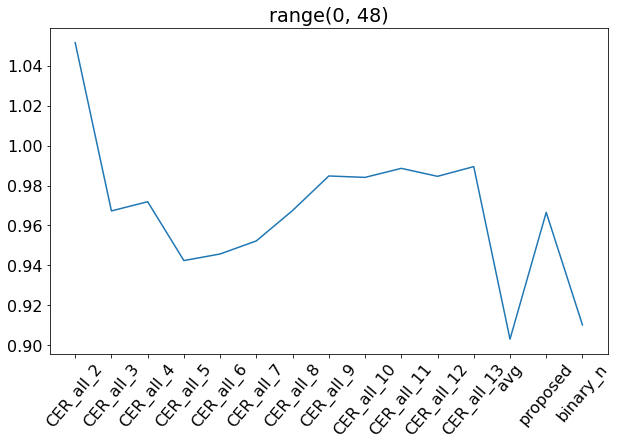

In [217]:
plt.figure(figsize = (10, 6))
idx = 0
plt.plot(result[idx])
plt.title(time_list[idx])
plt.xticks(range(len(list(rep_load_dict.keys()))), rep_load_dict.keys(), rotation = 50)
plt.show()

In [142]:
from sklearn import model_selection
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import KFold
from collections import defaultdict
from sklearn.svm import SVR

kf = KFold(n_splits=5, shuffle = True, random_state = 1)
y = label.copy()
y[y<=2] = 1
y[y> 2] = 2
# y[y <= 8] = 1
# y[(y > 8) * (y <= 11)] = 2
# y[(y > 11)] = 3
part = 2
p0 = range(0, 24*2)
p1 = range(0, 5*2) # T0
p2 = range(5*2, 9*2) # T1
p3 = range(9*2, 12*2) # T2
p4 = range(12*2, 15*2)
p5 = range(15*2, 18*2)
p6 = range(18*2, 21*2)
p7 = range(21*2, 24*2)
time_list = [p0, p1, p2, p3, p4, p5, p6, p7]

result = dict()
for n_cluster in range(2, 9):
    key = f'CER_T{part}_{n_cluster}'
    X = rep_load_dict[key]
    result_tmp = np.zeros(y.shape)

    for train_index, test_index in kf.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        rfc = RandomForestClassifier()
        rfc.fit(X_train, y_train)
        rfc_predict = rfc.predict(X_test)

        # print(key)
        result_tmp[test_index] = rfc_predict
    result[key] = result_tmp
    print(key)
    print((result_tmp == y).mean())

# reference
key = f'avg'
X = rep_load_dict[key][:,time_list[part+1]]
result_tmp = np.zeros(y.shape)

for train_index, test_index in kf.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    rfc = RandomForestClassifier()
    rfc.fit(X_train, y_train)
    rfc_predict = rfc.predict(X_test)

    # print(key)
    result_tmp[test_index] = rfc_predict
result[key] = result_tmp
print(key)
print((result_tmp == y).mean())



CER_T2_2
0.5423990132593278
CER_T2_3
0.534381745297564
CER_T2_4
0.5399321615787851
CER_T2_5
0.5417823003391921
CER_T2_6
0.5405488744989208
CER_T2_7
0.6022201665124884
CER_T2_8
0.5985198889916744
avg
0.6540240518038853


### intra clustering은 잘 될까?

In [511]:
from tslearn.clustering import TimeSeriesKMeans, KShape
from tqdm import tqdm

unique_home_arr = np.unique(home_arr_c)

model_dict_intra = dict()
for N_Cluster in [2]:
    key = 'binary_n'

    n_point_all, n_point_selected = [], []
    rep_load_list = []    
    var_list = []
    for h in tqdm(unique_home_arr):
        idx = home_arr_c == h
        data = CER_rs[idx,:]
        
        min_ = np.nanmin(data, axis=1).reshape(-1,1)
        max_ = np.nanmax(data, axis=1).reshape(-1,1)
        data_n = (data - min_)/(max_ - min_)

        model = TimeSeriesKMeans(n_clusters = N_Cluster, metric = 'euclidean', max_iter = 10000000, random_state = 0, verbose = False, n_jobs=-1)

        result = model.fit_predict(data_n)
        v, c = np.unique(result, return_counts = True)

        idx2 = result == v[np.argmax(c)]

        # 원본으로 평균
        rep_load_list.append(data[idx2].mean(axis=0))

        n_point_all.append(idx.sum())
        n_point_selected.append(idx2.sum())
        
        var_list.append(np.var(data[idx2], axis=0))

    rep_load_dict[key] = np.array(rep_load_list)



100%|██████████| 3243/3243 [02:39<00:00, 20.37it/s]


In [521]:
result_df

,avg,binary,ternary,quarternary,proposed,5,6,7,8,9,GNT,selected
0,0.561956,0.604479,0.652378,0.964646,0.653509,0.870133,0.769039,0.882006,0.890899,1.024661,1,0
1,0.242022,0.304659,0.305855,0.258062,0.407880,0.276644,0.594524,0.352929,0.543336,0.344104,3,0
2,0.001367,0.036227,0.108856,0.131327,0.182296,0.079841,0.120960,0.033303,0.221093,0.154486,4,0
3,1.499565,1.356372,1.483780,1.297559,1.805290,1.307458,1.194605,0.939407,1.996484,1.896092,2,6
4,0.786466,0.853606,0.978678,1.079793,0.715558,0.776510,0.973023,0.661140,1.098012,0.932192,4,6
...,...,...,...,...,...,...,...,...,...,...,...,...
3238,0.658539,0.701972,0.959056,0.720560,0.576296,0.223868,0.800583,0.548619,0.955924,1.082682,2,4
3239,0.636353,0.670296,0.615436,0.654892,0.607817,0.813156,0.853804,0.607523,0.559724,0.621887,1,7
3240,0.437493,0.289296,0.350010,0.386542,0.307371,0.471968,0.350380,0.253744,0.275413,0.302699,2,6
3241,0.283524,0.272762,0.270638,0.552657,0.314756,0.400691,0.413474,0.506561,0.640079,0.715269,2,2


In [492]:
rep_load_dict.keys()

dict_keys(['CER_all_2', 'CER_all_3', 'CER_all_4', 'CER_all_5', 'CER_all_6', 'CER_all_7', 'CER_all_8', 'CER_all_9', 'CER_all_10', 'CER_all_11', 'CER_all_12', 'CER_all_13', 'avg', 'proposed', 'ternary', 'binary', 'quarternary', 'binary_n_total_point', 'binary_n_selected_point', 'ternary_n_total_point', 'ternary_n_selected_point', 'quarternary_n_total_point', 'quarternary_n_selected_point', '5', '5_n_selected_point', '6', '6_n_selected_point', '7', '7_n_selected_point', '8', '8_n_selected_point', '9', '9_n_selected_point', 'total_point'])

In [520]:
# from sklearn.metrics import f1_score

kf = KFold(n_splits=5, shuffle = True, random_state = 0)

y = label.copy()
result_dict = dict()
for key in ['avg', 'binary', 'binary_n']:
    X = rep_load_dict[key]
    result_tmp = np.zeros(y.shape)

    for train_index, test_index in kf.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        rfc = RandomForestRegressor()
        rfc.fit(X_train, y_train)
        rfc_predict = rfc.predict(X_test)

        # print(key)
        result_tmp[test_index] = rfc_predict
    
    result_mae = mean_absolute_error(y, result_tmp)
    print(key + '::{:.3f}'.format(result_mae))
    result_dict[key] = result_tmp
    


avg::0.904
binary::0.916
binary_n::0.904


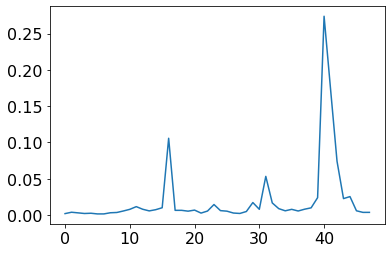

In [302]:
plt.plot(rfc.feature_importances_)
plt.show()

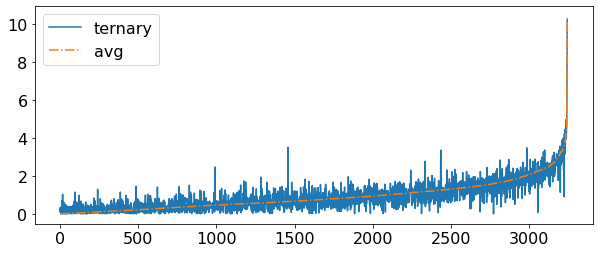

In [345]:
plt.figure(figsize = (10, 4))
result_df = pd.DataFrame(result_dict)
result_df['GNT'] = 0
result_df['avg'] = np.abs(label - result_df['avg'])
result_df['ternary'] = np.abs(label - result_df['ternary'])
idx = np.argsort(result_df['avg'])
result_df = result_df.loc[idx,:]

result_df['ratio'] = result_df['ternary_n_selected_point'] / result_df['ternary_n_total_point'] * 1000 // 10
plt.plot(result_df[['ternary']].values,'-')
plt.plot(result_df['avg'].values,'-.')
plt.legend(['ternary', 'avg'])
# 'avg','GNT','ternary','ternary_n_total_point','ratio'
plt.show()


In [499]:
result_dict['GNT'] = label.copy()

result_df = pd.DataFrame(result_dict)
list_ = ['avg','binary','ternary','quarternary']+ np.array(range(5, 10)).astype(str).tolist()

result_df['GNT'] = 0
for key in result_dict.keys():
    result_df[key] = np.abs(label - result_df[key])
# idx = np.argsort(result_df['avg'])
# result_df = result_df.loc[idx,:]

# better_idx = result_df['avg'] < result_df[key]
# result_df.loc[better_idx,key + '_n_total_point'].mean()


In [498]:
result_dict.keys()

dict_keys(['avg', 'binary', 'ternary', 'quarternary', 'proposed', '5', '6', '7', '8', '9'])

In [500]:

result_df['selected'] = np.argmin(result_df[list_].values, axis=1)

# idx = np.argsort(result_df['avg'])
# result_df = result_df.loc[idx.values,:]

# result_df['ratio'] = result_df['ternary_n_selected_point'] / result_df['ternary_n_total_point'] * 1000 // 10


In [501]:
np.unique(result_df['selected'], return_counts = True)

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 array([675, 352, 325, 303, 298, 234, 321, 338, 397]))

In [454]:
rep_load_dict.keys()

dict_keys(['CER_all_2', 'CER_all_3', 'CER_all_4', 'CER_all_5', 'CER_all_6', 'CER_all_7', 'CER_all_8', 'CER_all_9', 'CER_all_10', 'CER_all_11', 'CER_all_12', 'CER_all_13', 'avg', 'proposed', 'ternary', 'binary', 'quarternary', 'binary_n_total_point', 'binary_n_selected_point', 'ternary_n_total_point', 'ternary_n_selected_point', 'quarternary_n_total_point', 'quarternary_n_selected_point'])

In [462]:
proposed = np.zeros((3243, 48))

for i, key in enumerate(['avg','binary','ternary','quarternary']):
    idx = result_df['selected'] == i
    proposed[idx.values, :] = rep_load_dict[key][idx.values, :]
rep_load_dict['proposed'] = proposed


In [391]:
result_df_sub = result_df[['avg','binary','ternary','quarternary','selected']]


In [439]:
for key in ['binary','ternary','quarternary']:
    result_df[key + '_ratio'] = result_df[key + '_n_selected_point'] / result_df['total_point']

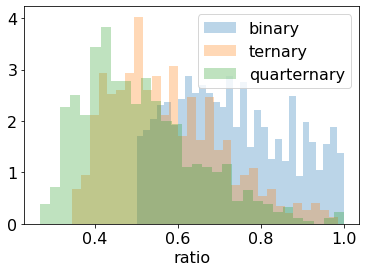

In [445]:
for i, key in enumerate(['binary','ternary','quarternary']):
    idx = result_df['selected'] == i
    plt.hist(result_df.loc[idx,key + '_ratio'].values.ravel(), density = True, bins = 30, label = key, alpha = 0.3)
plt.xlabel('ratio')
plt.legend()
plt.show()


In [431]:
result_df.columns

Index(['avg', 'quarternary', 'quarternary_n_selected_point', 'binary',
       'binary_n_selected_point', 'ternary', 'ternary_n_selected_point', 'GNT',
       'selected', 'ratio', 'total_point'],
      dtype='object')

In [396]:
idx = result_df['binary_n_total_point'] < 30
v, c = np.unique(result_df.loc[idx,'selected'], return_counts = True)
print(v)
print(c / c.sum() * 100)

[0 1 2 3]
[38.29787234 22.87234043 18.61702128 20.21276596]


In [420]:
v, c = np.unique(result_df.loc[:,'selected'], return_counts = True)
print(v)
print(c / c.sum() * 100)


[0 1 2 3]
[33.51834721 21.15325316 22.69503546 22.63336417]


In [472]:
result_df

,avg,binary,binary_n_total_point,binary_n_selected_point,ternary,ternary_n_total_point,ternary_n_selected_point,quarternary,quarternary_n_total_point,quarternary_n_selected_point,proposed,GNT,selected,ratio
1846,0.000011,0.033195,180,114,0.046191,180,101,0.138174,180,95,0.150615,0,0,56.0
1529,0.000470,0.061425,180,133,0.393053,180,75,0.133736,180,73,0.073824,0,0,41.0
2809,0.000758,0.172605,33,26,0.056280,33,24,0.181796,33,20,0.003892,0,0,72.0
409,0.001302,0.329583,179,109,0.350961,179,106,0.508386,179,62,0.264629,0,0,59.0
1788,0.002086,0.177834,180,102,0.263622,180,72,0.593438,180,65,0.070982,0,0,40.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2272,4.621215,4.634527,180,131,4.604943,180,123,4.499566,180,114,4.608918,0,3,68.0
278,5.410238,5.209939,180,160,4.712803,180,157,4.977417,180,150,5.081242,0,2,87.0
246,5.875246,5.699779,180,117,5.675580,180,103,5.686794,180,104,5.588109,0,4,57.0
1726,8.257995,8.054234,178,105,7.809212,178,120,7.790033,178,112,8.156799,0,3,67.0


In [427]:
idx = result_df['selected'] == 1
result_df.loc[idx,:].head(10)


,avg,quarternary,quarternary_n_selected_point,binary,binary_n_selected_point,ternary,ternary_n_selected_point,GNT,selected,ratio,total_point
1571,0.015381,0.053346,60,0.007765,127,0.008096,66,0,1,36.0,180
1972,0.023806,0.087198,89,0.019079,118,0.097645,94,0,1,52.0,180
589,0.025176,0.138905,81,0.017756,128,0.115319,103,0,1,79.0,129
3005,0.025652,0.114289,22,0.015139,28,0.232672,19,0,1,59.0,32
1,0.029216,0.091198,58,0.018551,110,0.169242,68,0,1,38.0,177
1885,0.029996,0.118588,106,0.025791,159,0.028551,106,0,1,58.0,180
2622,0.043745,0.573231,16,0.023014,21,0.028682,17,0,1,51.0,33
1331,0.049398,0.216224,75,0.036143,117,0.089183,87,0,1,49.0,175
454,0.051411,0.047450,113,0.023150,146,0.036952,138,0,1,76.0,180
899,0.051774,0.099884,50,0.028980,74,0.101820,51,0,1,40.0,127


### mean, variance에 차이가 있을까?

In [477]:
rep_load_dict['binary'].shape

(3243, 48)

In [478]:
rep_load_dict['avg'].shape

(3243, 48)

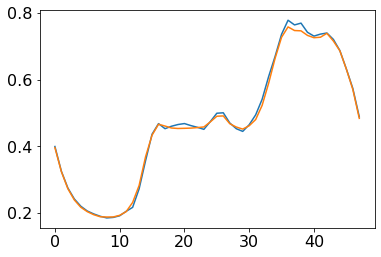

In [482]:
idx = result_df['selected'] == 2
plt.plot(rep_load_dict['ternary'][idx.values,:].mean(axis=0))

idx = result_df['selected'] != 2
plt.plot(rep_load_dict['ternary'][idx.values,:].mean(axis=0))

plt.show()

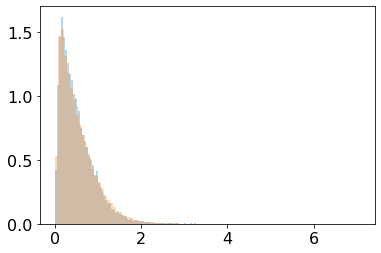

In [486]:
idx = result_df['selected'] == 0
plt.hist(rep_load_dict['avg'][idx.values,:].ravel(), bins = 100, density = True, alpha = 0.3)

idx = result_df['selected'] != 0
plt.hist(rep_load_dict['avg'][idx.values,:].ravel(), bins = 100, density = True, alpha = 0.3)

plt.show()

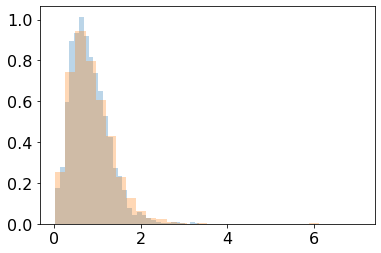

In [489]:
idx = result_df['selected'] == 0
plt.hist(rep_load_dict['avg'][idx.values,38:42].ravel(), bins = 30, density = True, alpha = 0.3)

idx = result_df['selected'] != 0
plt.hist(rep_load_dict['avg'][idx.values,38:42].ravel(), bins = 30, density = True, alpha = 0.3)

plt.show()


In [508]:
p1 = range(0, 5*2)
p2 = range(5*2, 9*2)
p3 = range(9*2, 12*2)
p4 = range(12*2, 15*2)
p5 = range(15*2, 18*2)
p6 = range(18*2, 21*2)
p7 = range(21*2, 24*2)
time_list = [p1, p2, p3, p4, p5, p6, p7]

for n_clusters in tqdm(range(10, 20)):
    for name, part in enumerate(time_list):
        # 1. KMeans
        model = TimeSeriesKMeans(n_clusters = n_clusters, metric = 'euclidean', \
            max_iter = 10000000, random_state = 0, verbose = 1, n_jobs=-1)
        result = model.fit_predict(CER_rs[:,part])
        kmeans_merge['CER_T'+str(name)+'_' + str(n_clusters)] = model



> 1.400 --> 1.400 --> 1.400 --> 1.400 --> 1.400 --> 1.400 --> 1.400 --> 1.400 --> 1.400 --> 1.400 --> 1.400 --> 1.400 --> 1.400 --> 1.400 --> 1.400 --> 1.400 --> 1.400 --> 1.400 --> 1.400 --> 1.400 --> 1.400 --> 1.400 --> 1.400 --> 1.400 --> 1.400 --> 1.400 --> 1.400 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 1.399 --> 
 20%|██        | 2/10 [5:23:07<21:36:

KeyboardInterrupt: 

In [510]:
kmeans_merge.keys()

dict_keys(['CER_T0_2', 'CER_T1_2', 'CER_T2_2', 'CER_T3_2', 'CER_T4_2', 'CER_T5_2', 'CER_T6_2', 'CER_all_2', 'CER_T0_3', 'CER_T1_3', 'CER_T2_3', 'CER_T3_3', 'CER_T4_3', 'CER_T5_3', 'CER_T6_3', 'CER_all_3', 'CER_T0_4', 'CER_T1_4', 'CER_T2_4', 'CER_T3_4', 'CER_T4_4', 'CER_T5_4', 'CER_T6_4', 'CER_all_4', 'CER_T0_5', 'CER_T1_5', 'CER_T2_5', 'CER_T3_5', 'CER_T4_5', 'CER_T5_5', 'CER_T6_5', 'CER_all_5', 'CER_T0_6', 'CER_T1_6', 'CER_T2_6', 'CER_T3_6', 'CER_T4_6', 'CER_T5_6', 'CER_T6_6', 'CER_all_6', 'CER_T0_7', 'CER_T1_7', 'CER_T2_7', 'CER_T3_7', 'CER_T4_7', 'CER_T5_7', 'CER_T6_7', 'CER_all_7', 'CER_T0_8', 'CER_T1_8', 'CER_T2_8', 'CER_T3_8', 'CER_T4_8', 'CER_T5_8', 'CER_T6_8', 'CER_all_8', 'CER_T0_9', 'CER_T1_9', 'CER_T2_9', 'CER_T3_9', 'CER_T4_9', 'CER_all_9', 'CER_all_10', 'CER_all_11', 'CER_all_12', 'CER_all_13', 'SAVE_all_2', 'SAVE_all_3', 'SAVE_all_4', 'SAVE_all_5', 'SAVE_all_6', 'SAVE_all_7', 'SAVE_all_8', 'SAVE_all_9', 'SAVE_all_10', 'SAVE_all_11', 'SAVE_all_12', 'SAVE_all_13', 'SAVE_all

MSE 계산

계층적 clustering 후에 cluster 개수 선정

In [594]:
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.metrics import mean_squared_error
from sklearn.cluster import AgglomerativeClustering

# plt.figure(figsize = (20, 4))

idx = home_arr_c == 0
data = CER_rs[idx,:]

# linked = linkage(data, 'ward')

# dendrogram(linked,
#             orientation='top',
#             distance_sort='descending',
#             show_leaf_counts=True)
# plt.xticks([], rotation = 30)
# plt.show()

# average of all
avg = data.mean(axis=0)
mse_= mean_squared_error(data, np.repeat(avg.reshape(1, -1), idx.sum(), 0))
print(mse_)

for n_cluster in range(2, 5):
    cluster = AgglomerativeClustering(n_clusters=n_cluster, affinity='euclidean', linkage='ward')
    result = cluster.fit_predict(data)

    from sklearn.decomposition import PCA
    pca = PCA(2)
    data_pca = pca.fit_transform(data)

    # plt.scatter(data_pca[:,0],data_pca[:,1], c=cluster.labels_, cmap='rainbow')

    mse_result = []
    n_points = []
    for i in range(n_cluster):
        idx = result == i
        avg = data[idx,:].mean(axis=0)
        mse_ = mean_squared_error(data[idx,:], np.repeat(avg.reshape(1, -1), idx.sum(), 0))
        mse_result.append(mse_)
        n_points.append(idx.sum())
        print(idx.sum())
        print(mse_)



0.06977600272047274
17
0.18427242589388695
162
0.03466890947454656
162
0.03466890947454656
12
0.12627277994791666
5
0.121752945
12
0.12627277994791666
85
0.04034880912918109
5
0.121752945
77
0.017759959513970875


In [589]:
result_df

,avg,binary,ternary,quarternary,proposed,5,6,7,8,9,GNT,selected
0,0.561956,0.604479,0.652378,0.964646,0.653509,0.870133,0.769039,0.882006,0.890899,1.024661,1,0
1,0.242022,0.304659,0.305855,0.258062,0.407880,0.276644,0.594524,0.352929,0.543336,0.344104,3,0
2,0.001367,0.036227,0.108856,0.131327,0.182296,0.079841,0.120960,0.033303,0.221093,0.154486,4,0
3,1.499565,1.356372,1.483780,1.297559,1.805290,1.307458,1.194605,0.939407,1.996484,1.896092,2,6
4,0.786466,0.853606,0.978678,1.079793,0.715558,0.776510,0.973023,0.661140,1.098012,0.932192,4,6
...,...,...,...,...,...,...,...,...,...,...,...,...
3238,0.658539,0.701972,0.959056,0.720560,0.576296,0.223868,0.800583,0.548619,0.955924,1.082682,2,4
3239,0.636353,0.670296,0.615436,0.654892,0.607817,0.813156,0.853804,0.607523,0.559724,0.621887,1,7
3240,0.437493,0.289296,0.350010,0.386542,0.307371,0.471968,0.350380,0.253744,0.275413,0.302699,2,6
3241,0.283524,0.272762,0.270638,0.552657,0.314756,0.400691,0.413474,0.506561,0.640079,0.715269,2,2


In [640]:
from tslearn.clustering import TimeSeriesKMeans, KShape
from tqdm import tqdm

unique_home_arr = np.unique(home_arr_c)
model_dict_intra = dict()
rep_load_dict = dict()

for option in ['ward','complete','average', 'single']:
    rep_load_list = []
    for home_idx in tqdm(np.unique(home_arr_c)):
        idx = home_arr_c == home_idx
        data_raw = CER_rs[idx,:]

        if idx.sum() <= 10:
            data_raw.mean(axis=0)
            rep_load_list.append(avg)
            continue

        mse_result = []
        avg_result = []

        key =  option+'_' + str(N_Cluster)
        data = data_raw

        for N_Cluster in range(2, 10):
            
            cluster = AgglomerativeClustering(n_clusters=n_cluster, affinity='euclidean', linkage=option)
            result = cluster.fit_predict(data)

            for i in range(N_Cluster):
                idx = result == i
                if idx.sum() == 0:
                    continue

                avg = data[idx,:].mean(axis=0)
                mse_ = mean_squared_error(data[idx,:], np.repeat(avg.reshape(1, -1), idx.sum(), 0))

                avg = data_raw[idx,:].mean(axis=0) # raw로 평균
                mse_result.append(mse_)
                avg_result.append(avg)
                # print(mse_)

        # 단순 평균
        avg = data.mean(axis=0)
        mse_ = mean_squared_error(data, np.repeat(avg.reshape(1, -1), data.shape[0], 0))
        mse_result.append(mse_)
        avg = data_raw.mean(axis=0) # raw로 평균
        avg_result.append(avg)

        best_cluster = np.argmin(mse_result)
        avg = avg_result[best_cluster]

        rep_load_list.append(avg)

    rep_load_arr = np.array(rep_load_list)


    from sklearn.svm import SVR

    X = rep_load_arr
    result_tmp = np.zeros(y.shape)

    for train_index, test_index in kf.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        # rfc = RandomForestRegressor()
        rfc = SVR(kernel='rbf', degree=3)
        rfc.fit(X_train, y_train)
        rfc_predict = rfc.predict(X_test)

        # print(key)
        result_tmp[test_index] = rfc_predict

    result_mae = mean_absolute_error(y, result_tmp)
    print(key + '::{:.3f}'.format(result_mae))
    result_dict[key] = result_tmp



100%|██████████| 3243/3243 [01:12<00:00, 44.81it/s]
single_9::1.016


In [647]:
from tslearn.clustering import TimeSeriesKMeans, KShape
from tqdm import tqdm

unique_home_arr = np.unique(home_arr_c)
model_dict_intra = dict()
rep_load_dict = dict()

rep_load_list = []
for home_idx in [1]:
    idx = home_arr_c == home_idx
    data_raw = CER_rs[idx,:]

    if idx.sum() <= 10:
        data_raw.mean(axis=0)
        rep_load_list.append(avg)
        continue

    mse_result = []
    avg_result = []

    key =  'ward_' + str(N_Cluster)
    data = data_raw

    for N_Cluster in range(2, 4):
        
        cluster = AgglomerativeClustering(n_clusters=n_cluster, affinity='euclidean', linkage='ward')
        result = cluster.fit_predict(data)

        for i in range(N_Cluster):
            idx = result == i
            if idx.sum() == 0:
                continue

            avg = data[idx,:].mean(axis=0)
            mse_ = mean_squared_error(data[idx,:], np.repeat(avg.reshape(1, -1), idx.sum(), 0))

            avg = data_raw[idx,:].mean(axis=0) # raw로 평균
            mse_result.append(mse_)
            avg_result.append(avg)
            print(idx.sum(), mse_)
            

    # 단순 평균
    avg = data.mean(axis=0)
    mse_ = mean_squared_error(data, np.repeat(avg.reshape(1, -1), data.shape[0], 0))
    mse_result.append(mse_)
    avg = data_raw.mean(axis=0) # raw로 평균
    avg_result.append(avg)

    best_cluster = np.argmin(mse_result)
    avg = avg_result[best_cluster]

    rep_load_list.append(avg)
    print(mse_)

rep_load_arr = np.array(rep_load_list)


# from sklearn.svm import SVR

# X = rep_load_arr
# result_tmp = np.zeros(y.shape)

# for train_index, test_index in kf.split(X):
#     X_train, X_test = X[train_index], X[test_index]
#     y_train, y_test = y[train_index], y[test_index]

#     # rfc = RandomForestRegressor()
#     rfc = SVR(kernel='rbf', degree=3)
#     rfc.fit(X_train, y_train)
#     rfc_predict = rfc.predict(X_test)

#     # print(key)
#     result_tmp[test_index] = rfc_predict

# result_mae = mean_absolute_error(y, result_tmp)
# print(key + '::{:.3f}'.format(result_mae))
# result_dict[key] = result_tmp



91 0.1917923785271505
38 0.10312224001615881
91 0.1917923785271505
38 0.10312224001615881
2 0.19392114583333334
0.1863520715324992


In [661]:
from sklearn.svm import OneClassSVM

clf = OneClassSVM(gamma='auto')
y_pred = clf.fit_predict(X)


In [667]:
(y_pred == 1).sum()

985

In [705]:
from sklearn.svm import SVC

valid_y = np.zeros((CER_rs.shape[0],))
unique_home_arr = np.unique(home_arr_c)

rep_load_list = []
for i, home_idx in tqdm(enumerate(unique_home_arr)):

    tmp_data = (home_arr_c < th + 30) * (home_arr_c >= th)

    X = CER_rs[tmp_data, :]
    y = (home_arr_c[tmp_data] == home_idx).astype(int)

    # y = (home_arr_c == 1).astype(int)
    # X = CER_rs
    result_tmp = np.zeros(y.shape)

    kf = KFold(n_splits=5, shuffle = True, random_state = 0)

    for train_index, test_index in kf.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        # rfc = RandomForestRegressor()
        rfc = SVC(kernel='rbf', degree=3)
        rfc.fit(X_train, y_train)
        rfc_predict = rfc.predict(X_test)

        # print(key)
        result_tmp[test_index] = rfc_predict

    rep_load_list.append(X[result_tmp == 1].mean(axis=0))
    result_mae = mean_absolute_error(y, result_tmp)
    print('{:.3f}'.format(result_mae))

# rep_load_list = np.array(rep_load_list)
# plt.plot(X[result_tmp == 1].mean(axis=0), label='predicted')
# plt.plot(X[y == 1].mean(axis=0), label='average')
# plt.legend()
# plt.show()


1it [00:00,  1.25it/s]0.033



ValueError: The number of classes has to be greater than one; got 1 class

## 대표 부하 선정

In [783]:
rep_load_list = []
for i in tqdm(unique_home_arr):
    idx = home_arr_c == i
    data_raw = CER_rs[idx,:]

    min_ = np.nanmin(data_raw, axis=1).reshape(-1,1)
    max_ = np.nanmax(data_raw, axis=1).reshape(-1,1)
    data = (data_raw - min_)/(max_ - min_)

    n_samples = data.shape[0]
    distance = np.zeros((n_samples, n_samples))
    for i in range(n_samples):
        for j in range(n_samples):
            distance[i, j] = np.linalg.norm(data[i,:]-data[j,:])

    rep_load_idx = np.argmin(distance.sum(axis=0))
    rep_load_list.append(data[rep_load_idx,:])
    break
rep_load_arr = np.array(rep_load_list)


  0%|          | 0/3243 [00:00<?, ?it/s]


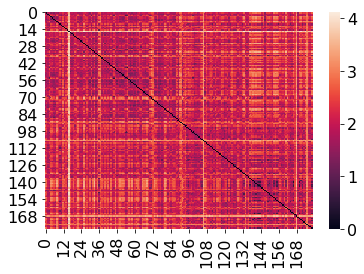

array([[0.        , 2.09120136, 1.87687537, ..., 2.34230567, 2.10019564,
        3.07540308],
       [2.09120136, 0.        , 1.73951844, ..., 2.12623638, 2.21152795,
        2.74811272],
       [1.87687537, 1.73951844, 0.        , ..., 1.69655189, 1.82081866,
        2.079314  ],
       ...,
       [2.34230567, 2.12623638, 1.69655189, ..., 0.        , 1.62992053,
        2.26055254],
       [2.10019564, 2.21152795, 1.82081866, ..., 1.62992053, 0.        ,
        2.25740161],
       [3.07540308, 2.74811272, 2.079314  , ..., 2.26055254, 2.25740161,
        0.        ]])

In [785]:
import seaborn as sns
sns.heatmap(distance)
plt.show()

In [791]:
idx = np.argsort(distance.sum(axis=0))
distance.sum(axis=0)[idx[::-1][:10]]

array([657.49763043, 588.61733422, 574.48218266, 535.50353103,
       485.3802322 , 484.48218167, 457.66631805, 456.81354305,
       456.68639914, 451.54832628, 442.20199964, 441.58638601,
       440.38192855, 439.80958676, 439.04873852, 436.21439516,
       435.64899972, 435.17856262, 433.66874664, 432.99623281,
       428.46438425, 427.94363768, 427.00092083, 425.16057709,
       423.63908328, 423.59079688, 421.74546215, 421.05171997,
       419.59572875, 418.61135107, 417.74735256, 417.6722477 ,
       417.44855107, 416.75397444, 415.46460636, 413.79276775,
       413.47251872, 413.25610014, 410.23840978, 410.15989057,
       409.07675718, 406.93844781, 405.51111344, 405.39593509,
       404.69511014, 404.11581362, 403.472392  , 403.37024433,
       403.15220978, 400.79350474, 400.65265025, 400.54362594,
       400.24771278, 399.92907419, 399.14250338, 398.2726999 ,
       397.87756299, 397.64134025, 397.47436383, 397.35427474,
       397.07021516, 396.37807029, 395.77238102, 395.69

In [ ]:
rep_load_list = []
for i in tqdm(unique_home_arr):
    idx = home_arr_c == i
    data_raw = CER_rs[idx,:]

    n_samples = data_raw.shape[0]
    distance = np.zeros((n_samples, n_samples))
    for i in range(n_samples):
        for j in range(n_samples):
            distance[i, j] = np.linalg.norm(data_raw[i,:]-data_raw[j,:])

    rep_load_idx = np.argmin(distance.sum(axis=0))
    rep_load_list.append(data_raw[rep_load_idx,:])

rep_load_arr = np.array(rep_load_list)

In [793]:
import multiprocessing
from functools import partial
import time

def helper(i):
    idx = home_arr_c == i
    data_raw = CER_rs[idx,:]

    n_samples = data_raw.shape[0]
    distance = np.zeros((n_samples, n_samples))
    for i in range(n_samples):
        for j in range(n_samples):
            distance[i, j] = np.linalg.norm(data_raw[i,:]-data_raw[j,:])

    # rep_load_idx = np.argmin(distance.sum(axis=0))
    return distance

PROCESSES = multiprocessing.cpu_count()
print('{}개의 CPU 사용...'.format(PROCESSES))

start = time.time()
if __name__ == '__main__':
    p = multiprocessing.Pool(processes = PROCESSES)
    distance_list = p.map(helper, unique_home_arr)

end = time.time()
print('Elapsed {:.2f} hours..'.format((end - start) / 3600))


eback (most recent call last):
  File "/home/ubuntu/anaconda3/envs/mskim/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/ubuntu/anaconda3/envs/mskim/lib/python3.6/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
  File "/home/ubuntu/anaconda3/envs/mskim/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/home/ubuntu/anaconda3/envs/mskim/lib/python3.6/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
  File "/home/ubuntu/anaconda3/envs/mskim/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/ubuntu/anaconda3/envs/mskim/lib/python3.6/multiprocessing/pool.py", line 108, in worker
    task = get()
KeyboardInterrupt
  File "/home/ubuntu/anaconda3/envs/mskim/lib/python3.6/multiprocessing/pool.py", line 108, in worker
    task = get()
  File "/home/ubuntu/a

In [821]:
def evaluate(X, y):
    '''
    대표 부하 평가 함수
    '''
    
    kf = KFold(n_splits=5, shuffle = True, random_state = 0)
    result_tmp = np.zeros(y.shape)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        rfc = RandomForestRegressor()
        # rfc = SVC(kernel='rbf', degree=3)
        rfc.fit(X_train, y_train)
        rfc_predict = rfc.predict(X_test)

        # print(key)
        result_tmp[test_index] = rfc_predict
    result_mae = mean_absolute_error(y, result_tmp)
    return result_mae, rfc

rep_load_list = []
for i, home_idx in enumerate(unique_home_arr):
    distance = distance_list[i]
    idx = np.argsort(distance.sum(axis=0))
    n = int(len(idx) * 0.9)
    if n == 0:
        final_idx = idx
    else:
        final_idx = idx[:n+1]
    data = CER_rs[home_arr_c == home_idx,:]
    data = data[final_idx,:]
    rep_load_list.append(data.mean(axis=0))

rep_load_arr = np.array(rep_load_list)
result, rfc = evaluate(rep_load_arr, label)
print(result)


0.8870243601603454


In [1112]:
for th in [-0.1, 0, 0.5, 1, 1.5, 2]:
    print(th)
    rep_load_list = []
    for i, home_idx in enumerate(unique_home_arr):
        distance = distance_list[i].mean(axis=0)
        mean_ = distance.mean()
        std_ = np.sqrt(distance.var())
        data = CER_rs[home_arr_c == home_idx,:]

        idx = distance <= mean_ + th * std_

        data = data[idx,:]
        rep_load_list.append(data.mean(axis=0))

    rep_load_arr = np.array(rep_load_list)
    result, rfc = evaluate(rep_load_arr, label)
    print(result)


-0.1
0.8795683009559049
0
0.8818162195497996
0.5
0.8866481652790626
1
0.888600061671292
1.5
0.8922880049337034
2
0.8879740980573543


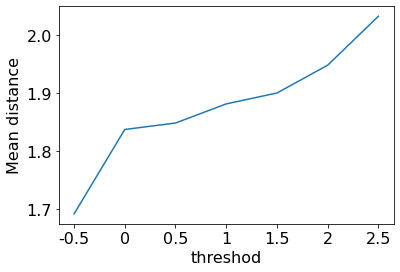

In [1091]:
i = 0

distance = distance_list[i].mean(axis=0)
mean_ = distance.mean()
std_ = np.sqrt(distance.var())

distances = []
th_list = [-0.5, 0, 0.5, 1, 1.5, 2, 2.5]
for th in th_list:
    idx = distance <= mean_ + th * std_
    distances.append(distance[idx].mean())

# print(idx.sum())
# print(distance[idx].mean())
plt.plot(distances)
plt.xticks(range(len(th_list)), th_list)
plt.xlabel('threshod')
plt.ylabel('Mean distance')
plt.show()

In [1109]:
sample_idx = 8

distance = distance_list[i]
mean_ = distance.mean(axis=0).mean()
std_ = np.sqrt(distance.mean(axis=0).var())

idx = distance.mean(axis=0) <= mean_
idx2 = np.where(idx)[0]
sub_dist = np.zeros((idx.sum(), idx.sum()))
for i1, i2 in enumerate(idx2):
    for j1, j2 in enumerate(idx2):
        sub_dist[i1, j1] = distance[i2, j2]


In [1108]:
distance.shape

(179,)

In [1103]:
idx2

(array([  0,   1,   2,   4,   5,   6,   7,   8,   9,  10,  13,  14,  15,
         16,  17,  18,  19,  21,  22,  23,  24,  25,  26,  27,  28,  29,
         30,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,  42,  43,
         44,  45,  47,  48,  49,  50,  51,  52,  53,  54,  56,  57,  58,
         59,  60,  61,  62,  63,  64,  65,  66,  67,  68,  69,  71,  72,
         73,  74,  75,  76,  77,  78,  79,  80,  81,  82,  83,  84,  85,
         86,  87,  89,  90,  91,  92,  95,  96,  97,  98, 100, 101, 102,
        103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115,
        116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128,
        129, 130, 131, 132, 133, 134, 135, 136, 138, 145, 147, 148, 150,
        151, 152, 154, 157, 158, 159, 160, 162, 163, 164, 165, 167, 168,
        169, 173, 174, 175, 176, 177]),)

In [1096]:
idx.shape

(179,)

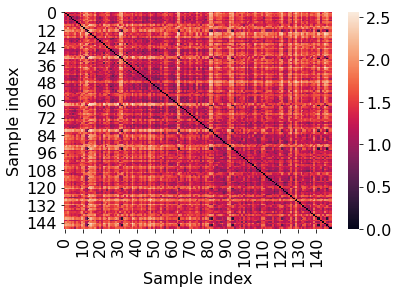

In [1113]:
def helper_2(i):
    distance = distance_list[i]
    mean_ = distance.mean(axis=0).mean()
    std_ = np.sqrt(distance.mean(axis=0).var())
    idx_rest = distance.mean(axis=0) <= mean_

    idx = home_arr_c == i
    data_raw = CER_rs[idx,:]
    data_raw = data_raw[idx_rest,:]

    n_samples = data_raw.shape[0]
    distance = np.zeros((n_samples, n_samples))
    for i in range(n_samples):
        for j in range(n_samples):
            distance[i, j] = np.linalg.norm(data_raw[i,:]-data_raw[j,:])

    # rep_load_idx = np.argmin(distance.sum(axis=0))
    return distance

sub_dist = helper_2(0)
# sns.heatmap(distance)
sns.heatmap(sub_dist)
plt.xlabel('Sample index')
plt.ylabel('Sample index')
plt.show()

# plt.plot(distance_list[sample_idx].mean(axis=0))
# plt.xlabel('Sample index')
# plt.ylabel('Distance')
# plt.show()


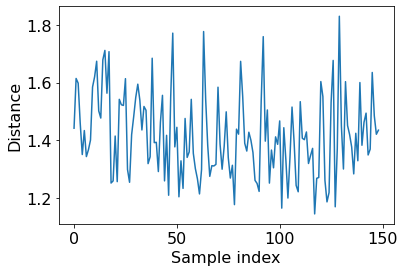

In [1117]:
plt.plot(sub_dist.mean(axis=0))
# plt.title('when threshold is mean')
plt.xlabel('Sample index')
plt.ylabel('Distance')
plt.show()

In [1051]:
distance = distance_list[1].mean(axis=0)
mean_ = distance.mean()
std_ = np.sqrt(distance.var())

idx = distance > mean_ + 3 * std_
idx.mean()


0.01694915254237288

In [996]:
result_df

,avg,binary,ternary,quarternary,proposed,5,6,7,8,9,GNT,selected
0,0.561956,0.604479,0.652378,0.964646,0.653509,0.870133,0.769039,0.882006,0.890899,1.024661,1,0
1,0.242022,0.304659,0.305855,0.258062,0.407880,0.276644,0.594524,0.352929,0.543336,0.344104,3,0
2,0.001367,0.036227,0.108856,0.131327,0.182296,0.079841,0.120960,0.033303,0.221093,0.154486,4,0
3,1.499565,1.356372,1.483780,1.297559,1.805290,1.307458,1.194605,0.939407,1.996484,1.896092,2,6
4,0.786466,0.853606,0.978678,1.079793,0.715558,0.776510,0.973023,0.661140,1.098012,0.932192,4,6
...,...,...,...,...,...,...,...,...,...,...,...,...
3238,0.658539,0.701972,0.959056,0.720560,0.576296,0.223868,0.800583,0.548619,0.955924,1.082682,2,4
3239,0.636353,0.670296,0.615436,0.654892,0.607817,0.813156,0.853804,0.607523,0.559724,0.621887,1,7
3240,0.437493,0.289296,0.350010,0.386542,0.307371,0.471968,0.350380,0.253744,0.275413,0.302699,2,6
3241,0.283524,0.272762,0.270638,0.552657,0.314756,0.400691,0.413474,0.506561,0.640079,0.715269,2,2


In [ ]:
plt.plot(data[rep_load_idx,:])
plt.plot(data.mean(axis=0))
plt.show()


In [765]:
kmeans_merge.keys()

dict_keys(['CER_T0_2', 'CER_T1_2', 'CER_T2_2', 'CER_T3_2', 'CER_T4_2', 'CER_T5_2', 'CER_T6_2', 'CER_all_2', 'CER_T0_3', 'CER_T1_3', 'CER_T2_3', 'CER_T3_3', 'CER_T4_3', 'CER_T5_3', 'CER_T6_3', 'CER_all_3', 'CER_T0_4', 'CER_T1_4', 'CER_T2_4', 'CER_T3_4', 'CER_T4_4', 'CER_T5_4', 'CER_T6_4', 'CER_all_4', 'CER_T0_5', 'CER_T1_5', 'CER_T2_5', 'CER_T3_5', 'CER_T4_5', 'CER_T5_5', 'CER_T6_5', 'CER_all_5', 'CER_T0_6', 'CER_T1_6', 'CER_T2_6', 'CER_T3_6', 'CER_T4_6', 'CER_T5_6', 'CER_T6_6', 'CER_all_6', 'CER_T0_7', 'CER_T1_7', 'CER_T2_7', 'CER_T3_7', 'CER_T4_7', 'CER_T5_7', 'CER_T6_7', 'CER_all_7', 'CER_T0_8', 'CER_T1_8', 'CER_T2_8', 'CER_T3_8', 'CER_T4_8', 'CER_T5_8', 'CER_T6_8', 'CER_all_8', 'CER_T0_9', 'CER_T1_9', 'CER_T2_9', 'CER_T3_9', 'CER_T4_9', 'CER_all_9', 'CER_all_10', 'CER_all_11', 'CER_all_12', 'CER_all_13', 'SAVE_all_2', 'SAVE_all_3', 'SAVE_all_4', 'SAVE_all_5', 'SAVE_all_6', 'SAVE_all_7', 'SAVE_all_8', 'SAVE_all_9', 'SAVE_all_10', 'SAVE_all_11', 'SAVE_all_12', 'SAVE_all_13', 'SAVE_all

## optimal number of clusters

In [862]:
i = 1

distance = distance_list[i]
idx = np.argsort(distance.sum(axis=0))
result_ref = np.ones((distance.shape[0],), dtype = int)
n = int(len(idx) * 0.9)
for i in idx[n:]:
    result_ref[i] = 0

print(result_ref)


[0 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0 1 0 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


In [973]:
mse_result_all = []
for i in tqdm(range(unique_home_arr.shape[0])):
    home_idx = unique_home_arr[i]
    idx = home_arr_c == home_idx
    data = CER_rs[idx,:]
    
    result_list = []
    result_list.append(np.zeros((idx.sum(),),dtype=int)) # avg of all
    
    distance = distance_list[i]
    idx = np.argsort(distance.sum(axis=0))
    result_ref = np.ones((distance.shape[0],), dtype = int)
    n = int(len(idx) * 0.9)
    for i in idx[n:]:
        result_ref[i] = 0
    result_list.append(result_ref) # avg w/ outlier

    

    if data.shape[0] >= 30:
        for n_clusters in range(2, 3):
            cluster = AgglomerativeClustering(n_clusters=n_clusters, affinity='l2', linkage='average')
            result = cluster.fit_predict(data)
            result_list.append(result)

    mse_result = []
    for result in result_list:
        v, c = np.unique(result, return_counts = True)
        idx = v[np.argmax(c)] == result
        avg = data[idx,:].mean(axis=0)
        mse_ = mean_squared_error(data[idx,:],  np.repeat(avg.reshape(1, -1), idx.sum(), 0))
        mse_result.append(mse_)
    
    mse_result_all.append(mse_result)

100%|██████████| 3243/3243 [00:14<00:00, 225.66it/s]


In [977]:
opt_list= []
for mse_result in mse_result_all:
    opt_list.append(np.argmin(mse_result))

rep_load_list = []
for i, opt in tqdm(enumerate(opt_list)):
    # data
    home_idx = unique_home_arr[i]
    idx = home_arr_c == home_idx
    data = CER_rs[idx,:]

    if opt == 0:
        rep_load_list.append(data.mean(axis=0))
    elif opt == 1:
        distance = distance_list[i]
        idx = np.argsort(distance.sum(axis=0))
        result_ref = np.ones((distance.shape[0],), dtype = int)
        n = int(len(idx) * 0.9)
        for i in idx[n:]:
            result_ref[i] = 0
        rep_load_list.append(data[result_ref == 1,:].mean(axis=0))
    else:
        cluster = AgglomerativeClustering(n_clusters=opt, affinity='l2', linkage='average')
        result = cluster.fit_predict(data)
        v, c = np.unique(result, return_counts = True)
        idx = v[np.argmax(c)] == result
        avg = data[idx,:].mean(axis=0)
        rep_load_list.append(avg)

result, rfc = evaluate(rep_load_arr, label)
print(result)

3243it [00:04, 720.52it/s]
0.9084890533456677
